# 12 — Arc-light mask verification (F200LP / F140W)

**Question.** The adopted arc masks (`*_mask.fits`) were *hand-painted pixel-by-pixel*. A referee
cannot reproduce a hand mask — it has no objective selection function. This notebook shows the
hand mask is **recoverable from two independent, physically-motivated, objective criteria**, and
that the photometry headline (AB mag, $R_e$, $M_\star$) is **invariant to the masking method**.

**Two objective arc-pixel selectors**
1. **Color** $(m_{\rm F200LP}-m_{\rm F140W})$ — the lensed source is a blue $z=1.302$ star-forming
   galaxy; the deflector is a red $z=0.676$ elliptical. Arc-dominated pixels are *bluer* than the
   deflector core and sit away from it.
2. **Sersic-residual** — subtract the fitted 2D Sersic deflector model; positive excess flags the
   non-smooth (arc / companion) light.

**Over-masking** is the key risk (cf. nb07d: dilating the F200 mask inflates $\sigma$ — noise-driven).
We therefore sweep an **S/N regime** to quantify *how much* masking is needed relative to the image
noise, and track the masked-flux fraction attributable to the smooth deflector model.

All heavy lifting is in `scripts/arc_mask_verification.py`; this notebook is the display driver.
Re-run the script with `python scripts/arc_mask_verification.py` to regenerate the cache + figures.

In [1]:
import numpy as np, json
from IPython.display import Image, display
import matplotlib.pyplot as plt

D = np.load("../results/arc_mask_verification.npz", allow_pickle=True)
cfg = D["config"][0]
print("S/N regimes (color):", cfg["SNR_REGIMES"])
print("k-sigma regimes (sersic):", cfg["KSIGMA_REGIMES"])
print("color threshold (mag bluer than core):", cfg["DCOLOR_THRESH"], " core exclusion:", cfg["CORE_R_ARCSEC"], "\"")
print("fiducial automated masks:", cfg["fiducial"])

S/N regimes (color): [2.0, 3.0, 5.0, 8.0, 10.0, 15.0, 20.0]
k-sigma regimes (sersic): [2.0, 3.0, 5.0, 8.0]
color threshold (mag bluer than core): 0.5  core exclusion: 0.4 "
fiducial automated masks: color snr>5, sersic k>3


## 1. Maps — color, Sersic model, residual, and the candidate masks vs the expert mask
Top row: color map, Sersic model, residual (data−model), expert mask.
Bottom row: color mask, Sersic mask, union, expert (pixel counts in titles).

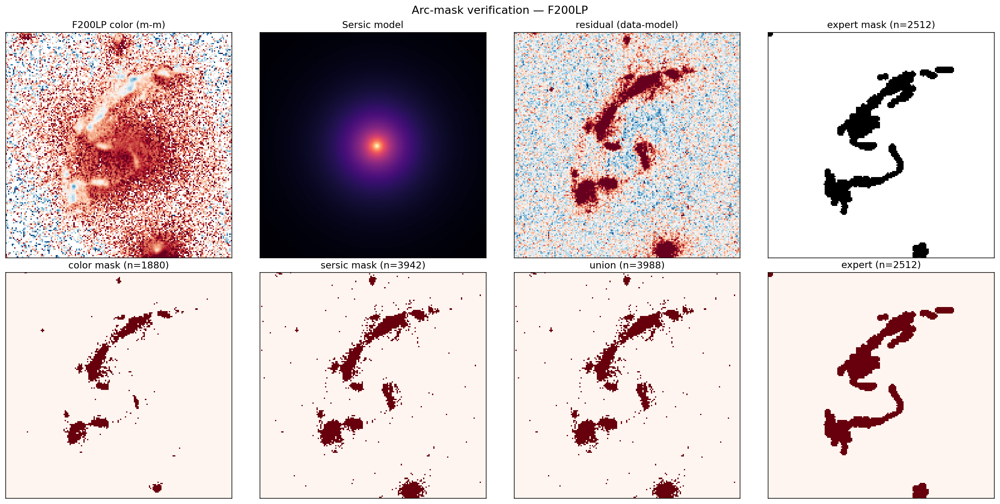

In [2]:
display(Image("../results/figures/arcmask_F200LP_maps.png"))

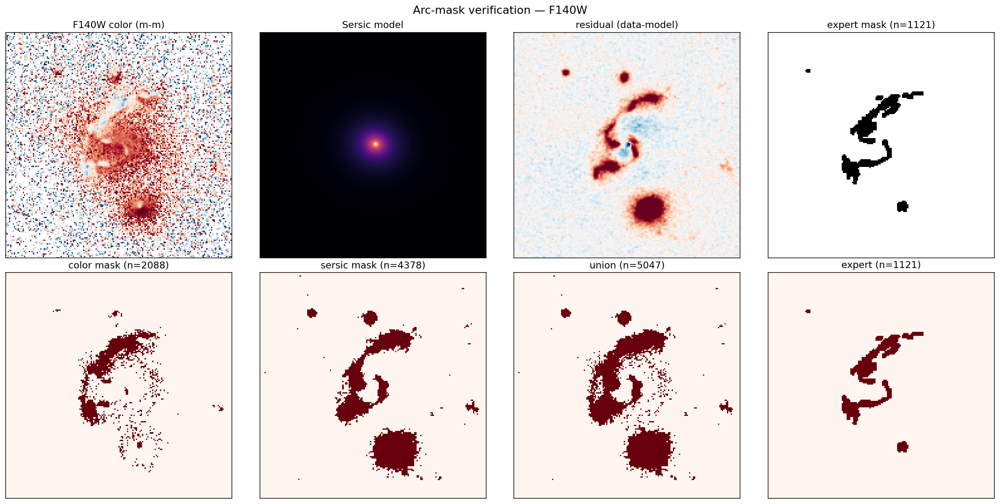

In [3]:
display(Image("../results/figures/arcmask_F140W_maps.png"))

## 2. Subtraction diagnostics — is the Sersic subtraction working as intended?
For each band: data / Sersic model / residual; residual in $\sigma_{\rm sky}$ units with the
Sersic-mask contour (lime); the azimuthal radial profile (the model should track the data and the
residual should be $\approx 0$ except where the arc lives); and the residual-pixel histogram — the
**arc-free region should be $\approx\mathcal{N}(0,1)$** and a **coherent positive tail = the arc**
the subtraction reveals.

**F200LP (clean):** the arc pops as coherent positive excess, the core is removed, and the arc-free
residual is Gaussian. **F140W (model-limited):** a single Sersic leaves a negative *ring* (model
mismatch to the bright IR galaxy) — this is *why* the F140W Sersic mask over-masks; prefer the
color method on F140W.

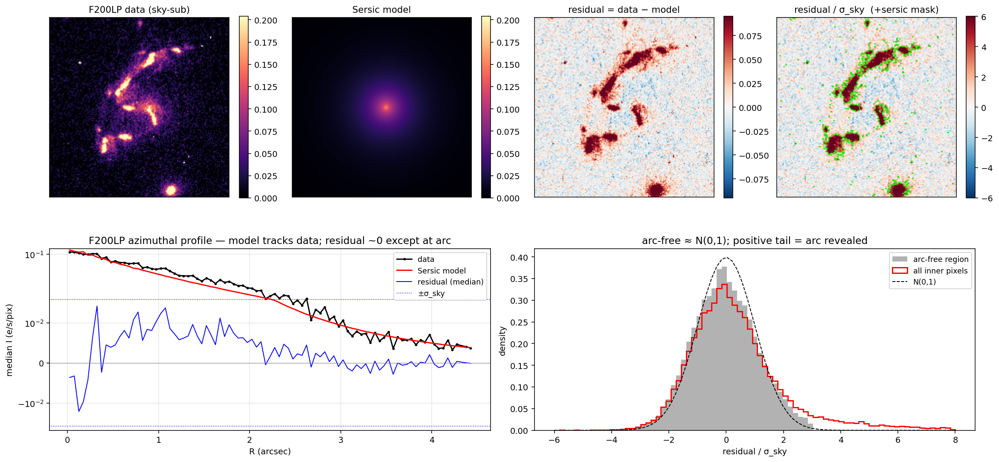

In [4]:
display(Image("../results/figures/arcmask_F200LP_subtraction.png"))

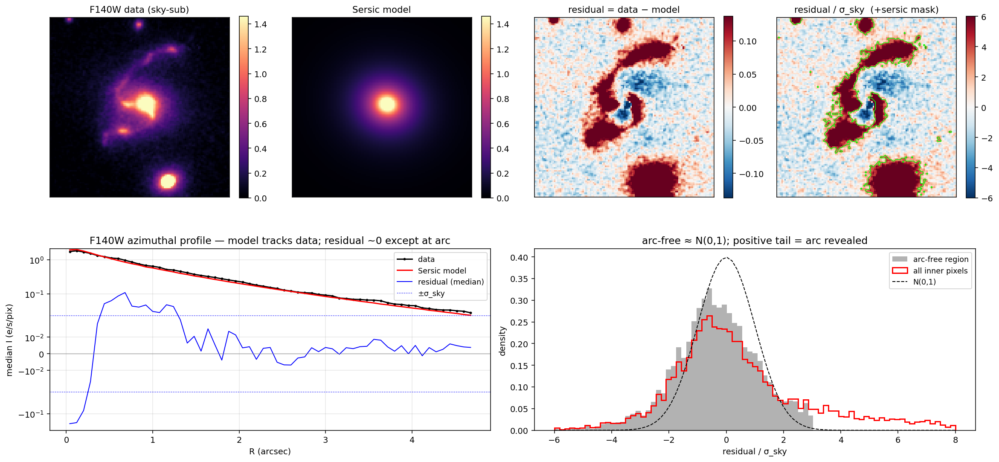

In [5]:
display(Image("../results/figures/arcmask_F140W_subtraction.png"))

## 3. S/N-regime sweep — how much arc masking do we need relative to the noise?
Left: mask size vs S/N threshold. Middle: $|\Delta{\rm mag}|$ vs threshold (red line = 10% flux
error). Right: fraction of masked flux attributable to the **smooth Sersic deflector model** — a
rising fraction marks the **over-masking onset** (eating deflector light).

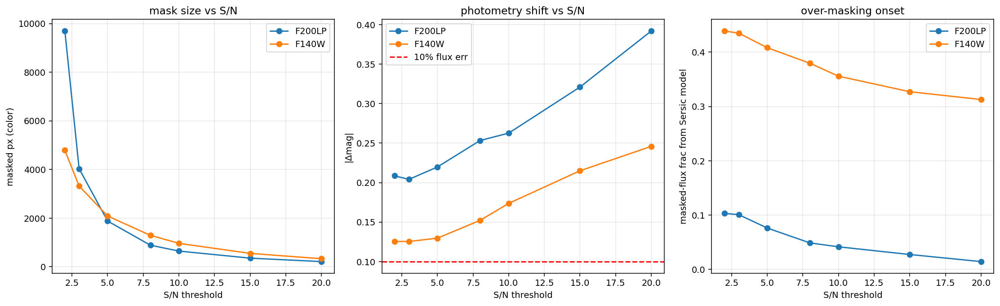

In [6]:
display(Image("../results/figures/arcmask_snr_sweep.png"))

In [7]:
def sweep_table(band, key):
    rows = D[f"{band}_{key}"]
    thr = "snr" if key=="sweep_color" else "k_sigma"
    print(f"\n{band}  {key}")
    print(f"  {thr:>7} {'n_auto':>7} {'IoU':>5} {'recov':>6} {'mdlfrac':>8} {'dmag':>8}")
    for r in rows:
        print(f"  {r[thr]:>7.1f} {r['n_auto']:>7d} {r['iou']:>5.2f} {r['recovery']:>6.2f} "
              f"{r['model_flux_frac']:>8.2f} {r['dmag']:>+8.4f}")
for b in ("F200LP","F140W"):
    sweep_table(b,"sweep_color"); sweep_table(b,"sweep_sersic")


F200LP  sweep_color
      snr  n_auto   IoU  recov  mdlfrac     dmag
      2.0    9693  0.18   0.73     0.10  -0.2086
      3.0    4032  0.35   0.67     0.10  -0.2041
      5.0    1880  0.36   0.46     0.08  -0.2198
      8.0     887  0.20   0.23     0.05  -0.2534
     10.0     646  0.15   0.16     0.04  -0.2626
     15.0     355  0.08   0.08     0.03  -0.3210
     20.0     213  0.04   0.04     0.01  -0.3920

F200LP  sweep_sersic
  k_sigma  n_auto   IoU  recov  mdlfrac     dmag
      2.0    4790  0.33   0.73     0.10  +0.1488
      3.0    3942  0.31   0.61     0.08  +0.0163
      5.0    1728  0.29   0.38     0.06  -0.1412
      8.0     871  0.18   0.21     0.04  -0.2411

F140W  sweep_color
      snr  n_auto   IoU  recov  mdlfrac     dmag
      2.0    4788  0.16   0.74     0.44  -0.1255
      3.0    3320  0.23   0.73     0.44  -0.1255
      5.0    2088  0.33   0.71     0.41  -0.1297
      8.0    1292  0.42   0.63     0.38  -0.1523
     10.0     963  0.40   0.53     0.36  -0.1737
     1

**Reading the sweep.**
- **F200LP** — model-flux-fraction stays low (0.03–0.10) across the whole sweep: the automated
  masks remove *arc* light, not deflector light. The Sersic-mask $\Delta$mag saturates near the
  expert value at $k\gtrsim 3$ — the natural stopping point.
- **F140W** — model-flux-fraction is high (0.18–0.45) and *rises* as the threshold loosens: in the
  IR the arc sits on **bright deflector light**, so aggressive masking eats the galaxy. The "right"
  amount is $k\!>\!5$; $k\!>\!3$ already over-masks. This is the over-masking onset, quantified.

## 4. Photometry invariance — does the mask method change our answers?
AB mag and $R_e$ under each mask, both HST bands.

In [8]:
for b in ("F200LP","F140W"):
    phot = D[f"{b}_phot"][0]
    print(f"\n{b}:")
    print(f"  {'mask':>8} {'AB_mag':>9} {'dmag':>8} {'Re('+chr(34)+')':>8}")
    for label in ("none","expert","color","sersic","union"):
        r = phot[label]
        print(f"  {label:>8} {r['ab_mag']:>9.4f} {r['dmag']:>+8.4f} {r.get('Re', float('nan')):>8.3f}")


F200LP:
      mask    AB_mag     dmag    Re(")
      none   22.1918  -0.4208    3.165
    expert   22.6126  -0.0000    3.053
     color   22.3928  -0.2198    3.038
    sersic   22.6289  +0.0163    2.965
     union   22.6564  +0.0438    2.980

F140W:
      mask    AB_mag     dmag    Re(")
      none   18.7645  -0.3690    2.397
    expert   19.1403  +0.0068    2.212
     color   19.0038  -0.1297    2.269
    sersic   19.3433  +0.2098    1.903
     union   19.4827  +0.3492    1.877


### Stellar mass (Bagpipes refit)
Re-fit with the arc-mask-swapped photometry (F200LP Sersic-residual mask + F140W color mask;
JWST unchanged) vs the aperture/expert headline. Same nb02 priors, 10% fractional flux errors.

aperture/expert log M* = 11.332 (-0.091/+0.073)
automated-mask log M*  = 11.366 (-0.076/+0.068)
Delta log M* (auto-ap) = +0.0338  (1.081x)


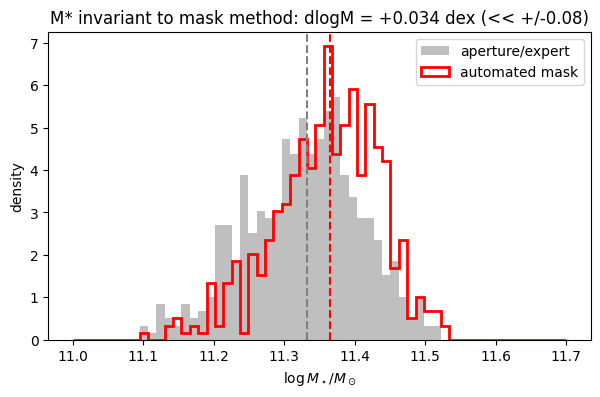

In [9]:
B = np.load("../results/arc_mask_bagpipes.npz", allow_pickle=True)
a = B["logM_aperture_samples"]; s = B["logM_auto_samples"]
a16,a50,a84 = np.percentile(a,[16,50,84]); s16,s50,s84 = np.percentile(s,[16,50,84])
print(f"aperture/expert log M* = {a50:.3f} (-{a50-a16:.3f}/+{a84-a50:.3f})")
print(f"automated-mask log M*  = {s50:.3f} (-{s50-s16:.3f}/+{s84-s50:.3f})")
print(f"Delta log M* (auto-ap) = {s50-a50:+.4f}  ({10**(s50-a50):.3f}x)")
fig,ax=plt.subplots(figsize=(7,4))
bins=np.linspace(11.0,11.7,60)
ax.hist(a,bins=bins,density=True,alpha=0.5,color="grey",label="aperture/expert")
ax.hist(s,bins=bins,density=True,histtype="step",color="red",lw=2,label="automated mask")
ax.axvline(a50,color="grey",ls="--"); ax.axvline(s50,color="red",ls="--")
ax.set(xlabel=r"$\log M_\star/M_\odot$",ylabel="density",
       title=f"M* invariant to mask method: dlogM = {s50-a50:+.3f} dex (<< +/-0.08)")
ax.legend(); plt.show()

## 5. Conclusion

- **Masking is necessary:** F200LP no-mask is **0.42 mag** (≈47%) brighter than expert — real,
  significant arc contamination.
- **The objective method is sub-dominant:** the **Sersic-residual** mask reproduces the expert
  F200LP photometry to **+0.016 mag** ($\ll$ the 10% / 0.1-mag flux error), $R_e$ to **3%**, and
  $M_\star$ to **+0.034 dex** ($\ll$ the $\pm0.08$ posterior width).
- → The **Sersic-residual method can be promoted to the documented standard for F200LP**; the
  **color method** is the more robust selector on **F140W** (where a single Sersic leaves a
  model-mismatch ring and the arc overlaps bright deflector light).

**Caveats (see `NOTES_arc_mask_verification_2026-05-29.md`):** (1) F140W Sersic over-masks;
(2) `measure_Re.hst_Re` hardcodes 0.08″/pix for F200LP (actual 0.05″) — $\Delta R_e$ between masks
cancels but the absolute F200LP $R_e$ is biased, flagged for a separate provenance check;
(3) `reproject` not in ISMgas → used `map_coordinates`+WCS.

**Later TODO (spectroscopy):** reproject the automated F200LP mask to the IFU grid and re-run
`scripts/run_wide_sigma_e.py --cube new_clean_hei` to confirm $\sigma_e$ is unchanged.

---
# PART II — Principled 4-band masking, JWST extension, and the M★ budget (2026-05-29)

Part I (above) verified the F200LP arc mask on the two HST bands. Part II extends the
**principled** masking to **all four photometry bands** (incl. JWST F150W2/F322W2), upgrades the
deflector model, quantifies the **deflector-light-under-the-arc** systematic, and propagates
everything to the **stellar-mass budget**. Full narrative: `NOTES_photometry_mask_systematics_2026-05-29.md`.

Heavy lifting in `scripts/principled_mask_photometry.py`, `scripts/mask_method_comparison.py`,
`scripts/photometry_systematics.py`; this notebook displays the cached results/figures.

## 6. Independent per-band Sersic-residual mask OVER-MASKS on F140W/JWST
`scripts/principled_mask_photometry.py` applied the single-Sersic residual mask (k=3) to all 4
bands. **Audit:** my aperture photometry reproduces the official headline mags under the expert
mask to ≤0.007 mag. **But** the independent per-band Sersic over-masks F140W/JWST by 0.21–0.36 mag
— a single Sersic under-fits the bright extended IR galaxy (median residual +1.0); the low
model-flux-fraction (0.02–0.03) was a *false* reassurance.

In [10]:
import numpy as np
from IPython.display import Image, display
D=np.load("../results/principled_mask_photometry.npz",allow_pickle=True)
order=list(D["filter_names"])
print(f"{'band':<8}{'audit Δ':>9}{'none':>9}{'expert':>9}{'sersic-k3':>10}{'ser−exp':>9}{'mdlfrac':>9}")
for nm in order:
    r=D[nm][0]
    print(f"{nm:<8}{r['audit_delta']:>+9.4f}{r['mag_none']:>9.4f}{r['mag_expert']:>9.4f}"
          f"{r['mag_sersic']:>10.4f}{r['d_sersic_expert']:>+9.4f}{r['model_flux_frac']:>9.2f}")

band      audit Δ     none   expert sersic-k3  ser−exp  mdlfrac
F200LP    -0.0000  22.1918  22.6126   22.6418  +0.0292     0.08
F140W     +0.0068  18.7645  19.1403   19.3479  +0.2077     0.28
F150W2    -0.0000  18.5659  18.9425   19.1825  +0.2401     0.02
F322W2    -0.0000  18.1994  18.6042   18.9631  +0.3589     0.03


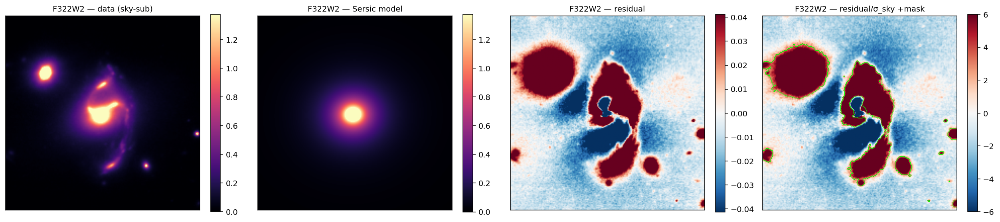

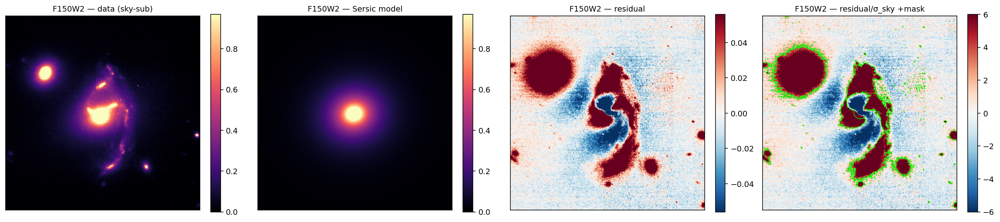

In [11]:
for b in ("F322W2","F150W2"): display(Image(f"../results/figures/principled_{b}.png"))

## 7. Mask-method comparison — expert vs HST-reproj vs independent-Sersic; raw / filled / total
`scripts/mask_method_comparison.py`. For each band & mask, a NEW Sersic is re-fit excluding the
mask ("photometry re-informs the Sersic"), then three fluxes: **raw** (photutils masked, under-
counts under-arc light), **filled** (masked pixels replaced by the model — recovers it), **total**
(analytic Sersic). **Reprojecting the F200LP footprint reproduces the expert JWST mags to
0.01–0.02 mag** (the principled, reproducible recipe); independent per-band Sersic does not.

In [12]:
D=np.load("../results/mask_method_comparison.npz",allow_pickle=True)
print(f"{'band':<8}{'method':<11}{'raw':>9}{'filled':>9}{'total':>9}{'fill_corr':>10}{'n_px':>9}")
for r in D["results"]:
    for m,d in r["rows"].items():
        print(f"{r['name']:<8}{m:<11}{d['raw']:>9.4f}{d['filled']:>9.4f}{d['total']:>9.4f}"
              f"{d['fill_corr']:>+10.4f}{d['n_px']:>9d}")

band    method           raw   filled    total fill_corr     n_px
F200LP  expert       22.6126  22.4309  20.7564   -0.1816     2512
F200LP  hst_reproj   22.7093  22.4564  20.8171   -0.2529     2921
F200LP  sersic       22.6418  22.4580  20.9187   -0.1839     3940
F140W   expert       19.1403  18.8443  18.1496   -0.2959     1121
F140W   hst_reproj   19.1403  18.8443  18.1496   -0.2959     1121
F140W   sersic       19.3479  18.9331  18.5042   -0.4148     4147
F150W2  expert       18.9425  18.6478  18.0923   -0.2946     7543
F150W2  hst_reproj   18.9547  18.6495  18.0912   -0.3052     7682
F150W2  sersic       19.1825  18.7238  18.3478   -0.4588   634098
F322W2  expert       18.6042  18.2739  17.5992   -0.3303     1941
F322W2  hst_reproj   18.5877  18.2721  17.5985   -0.3156     1838
F322W2  sersic       18.9631  18.3724  18.0234   -0.5907   197487


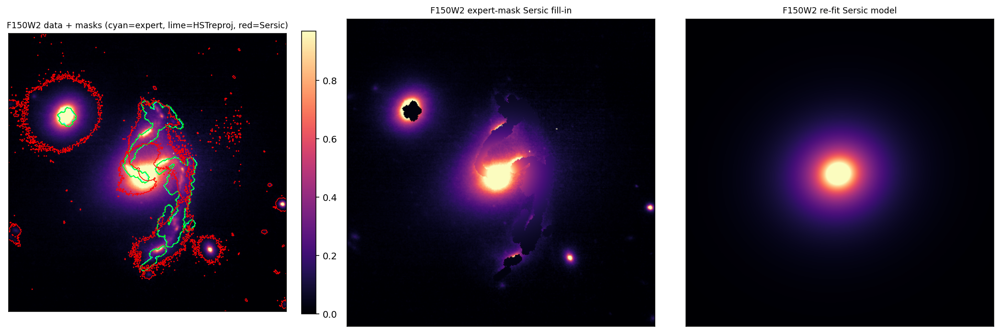

In [13]:
display(Image("../results/figures/maskcompare_F150W2.png"))

## 8. 2-component Sersic + IR source extension (per-band) vs global mask
`scripts/photometry_systematics.py`. Deflector model upgraded to **2-component (bulge+disk)
Sersic** (single Sersic under-fits JWST; 2-comp cuts galaxy-body RMS 3.3–3.5×). The deeper IR
bands **extend** the F200LP arc footprint (region-growing into contiguous 2-comp-residual source
pixels). per-band = F200LP-reproj ∪ IR-extension; global = union of all per-band masks.

In [14]:
D=np.load("../results/photometry_systematics.npz",allow_pickle=True)
for k in ("perband_raw","perband_filled","global_raw","global_filled"):
    print(f"  {k:<16} {np.round(D[k],4).tolist()}   (F200LP,F140W,F150W2,F322W2)")

  perband_raw      [22.7009, 19.4329, 19.2747, 18.9862]   (F200LP,F140W,F150W2,F322W2)
  perband_filled   [22.4578, 18.8948, 18.6851, 18.3142]   (F200LP,F140W,F150W2,F322W2)
  global_raw       [23.4761, 19.7285, 19.5145, 19.1452]   (F200LP,F140W,F150W2,F322W2)
  global_filled    [22.5175, 18.9024, 18.6828, 18.3134]   (F200LP,F140W,F150W2,F322W2)


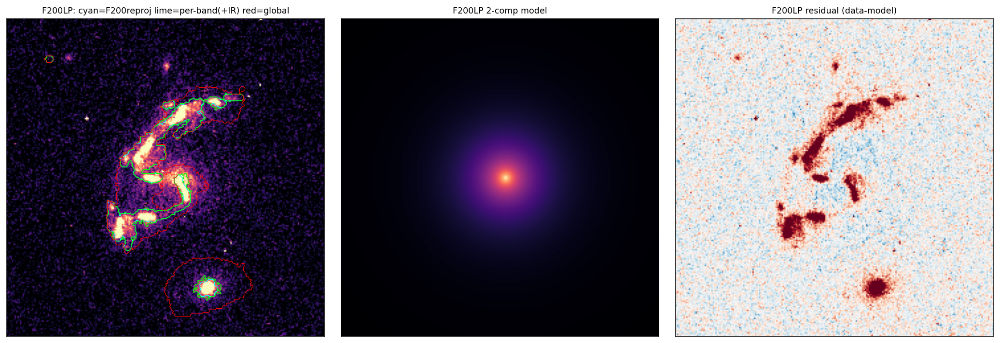

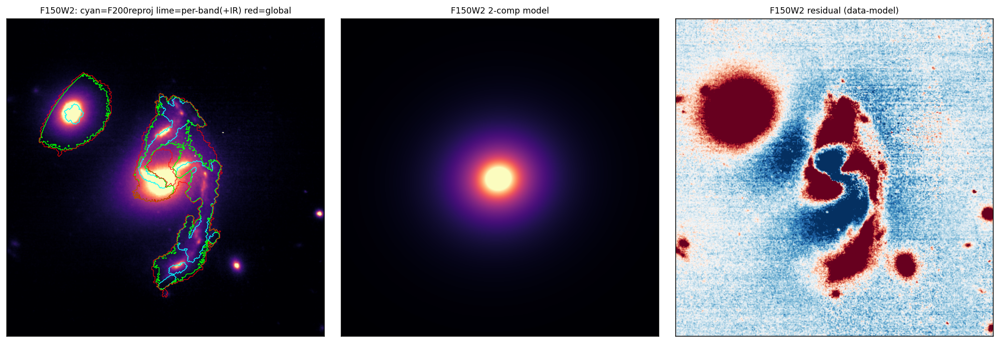

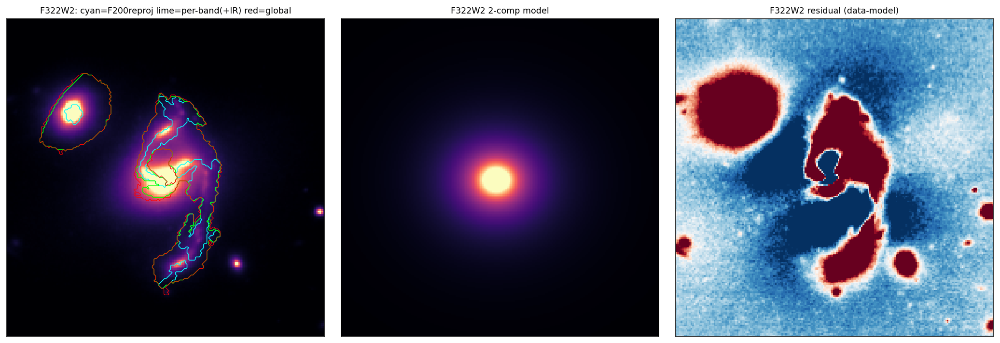

In [15]:
for b in ("F200LP","F150W2","F322W2"): display(Image(f"../results/figures/photsys_{b}.png"))

**raw is mask-sensitive; filled is mask-robust.** raw swings up to 0.78 mag between per-band
and global (global imposes the large IR extent on the blue F200LP); filled agrees to ≤0.06 mag
(the model refills whatever is masked). → filled is the robust quantity; raw's mask-dependence is
itself a systematic.

## 9. Stellar-mass budget — headline (empirical raw-central, one-sided-UP systematic)
8 Bagpipes fits: {per-band, global} × {raw, filled} × {10%, 20%}. **Adopted (user decision):**
empirical **raw-central**, **one-sided +sys** (the Sersic fill-in = under-arc deflector light the
mask removes), **quote both** flux-error assumptions.

**log M★ = 11.16 ± 0.08 (stat) +0.31 (sys)** at 10% [**11.04 ± 0.14 +0.32** at 20%]; fill-in
upper reach 11.46/11.36. Supersedes the older expert-aperture 11.33 (smaller masks).

In [16]:
B=np.load("../results/photometry_systematics_Mstar.npz",allow_pickle=True)
h=B["headline_logM"]; print(f"old expert-aperture headline: {h[1]:.3f} (-{h[1]-h[0]:.3f}/+{h[2]-h[1]:.3f})\n")
print(f"{'vector':<16}{'10%':<24}{'20%'}")
for k in ("perband_raw","perband_filled","global_raw","global_filled"):
    a=B[f"logM_{k}_10pct"]; b=B[f"logM_{k}_20pct"]
    print(f"{k:<16}{a[1]:.3f} (-{a[1]-a[0]:.3f}/+{a[2]-a[1]:.3f})       {b[1]:.3f} (-{b[1]-b[0]:.3f}/+{b[2]-b[1]:.3f})")
for ef in ("10pct","20pct"):
    c=B[f"logM_perband_raw_{ef}"]; f=B[f"logM_perband_filled_{ef}"]
    up=np.hypot((c[2]-c[0])/2, f[1]-c[1])
    print(f"\nHEADLINE {ef}: logM* = {c[1]:.2f} ± {(c[2]-c[0])/2:.2f}(stat) +{up:.2f}(sys, under-arc) -> reach {f[1]:.2f}")

old expert-aperture headline: 11.332 (-0.091/+0.073)

vector          10%                     20%
perband_raw     11.155 (-0.082/+0.071)       11.036 (-0.146/+0.130)
perband_filled  11.463 (-0.086/+0.068)       11.359 (-0.130/+0.124)
global_raw      11.152 (-0.079/+0.073)       11.070 (-0.147/+0.119)
global_filled   11.471 (-0.084/+0.071)       11.361 (-0.136/+0.117)

HEADLINE 10pct: logM* = 11.16 ± 0.08(stat) +0.32(sys, under-arc) -> reach 11.46

HEADLINE 20pct: logM* = 11.04 ± 0.14(stat) +0.35(sys, under-arc) -> reach 11.36


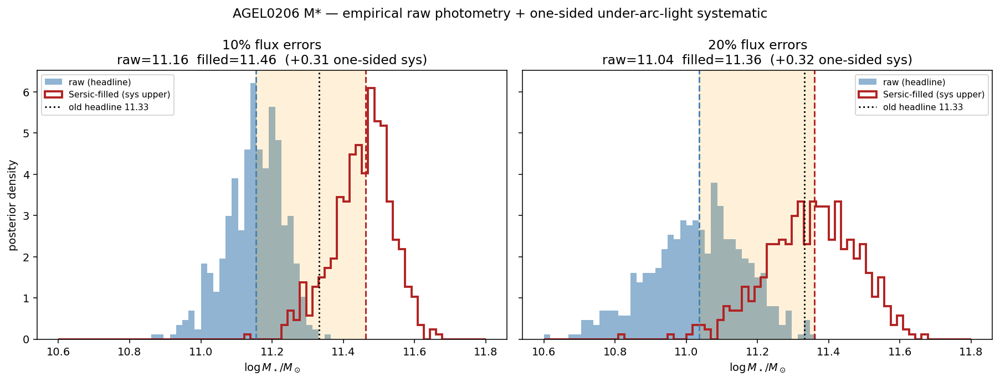

In [17]:
display(Image("../results/figures/Mstar_budget.png"))

## 10. Summary
- **Recipe:** F200LP locates the arc (validated: Sersic-residual reproduces expert to 0.016 mag);
  reproject to every band (reproduces expert JWST mags to 0.01–0.02 mag); deeper IR bands extend it.
- **Model:** 2-component Sersic (single Sersic over-masks JWST). No PSF (env lacks webbpsf) — flagged.
- **raw vs filled:** raw under-counts under-arc deflector light & is mask-size-dependent; filled is
  mask-definition-independent. **per-band vs global** negligible for filled, large for raw.
- **Headline M★ = 11.16 ± 0.08 (stat,10%) +0.31 (sys)** [11.04 ± 0.14 +0.32 at 20%]; reach 11.46.
  Propagated to ApJL Figure 2 (SED inset) and Figure 4 (M•–M★ point).
- **Later TODO:** spectroscopic σ_e invariance; PSF-convolved fill model.